## Visualization of CNN: Grad-CAM
* **Objective**: Convolutional Neural Networks are widely used on computer vision. It is powerful for processing grid-like data. However we hardly know how and why it works, due to the lack of decomposability into individually intuitive components. In this assignment, we use Grad-CAM, which highlights the regions of the input image that were important for the neural network prediction.


* NB: if `PIL` is not installed, try `conda install pillow`.

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, datasets, transforms
import matplotlib.pyplot as plt
import pickle
import urllib.request

import numpy as np
from PIL import Image

%matplotlib inline

### Download the Model
We provide you a pretrained model `ResNet-34` for `ImageNet` classification dataset.
* **ImageNet**: A large dataset of photographs with 1 000 classes.
* **ResNet-34**: A deep architecture for image classification.

In [2]:
resnet34 = models.resnet34(pretrained=True)
resnet34.eval() # set the model to evaluation mode

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:01<00:00, 54.2MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

![ResNet34](https://miro.medium.com/max/1050/1*Y-u7dH4WC-dXyn9jOG4w0w.png)


Input image must be of size (3x224x224).

First convolution layer with maxpool.
Then 4 ResNet blocks.

Output of the last ResNet block is of size (512x7x7).

Average pooling is applied to this layer to have a 1D array of 512 features fed to a linear layer that outputs 1000 values (one for each class). No softmax is present in this case. We have already the raw class score!

In [3]:
classes = pickle.load(urllib.request.urlopen('https://gist.githubusercontent.com/yrevar/6135f1bd8dcf2e0cc683/raw/d133d61a09d7e5a3b36b8c111a8dd5c4b5d560ee/imagenet1000_clsid_to_human.pkl'))

##classes is a dictionary with the name of each class
print(classes)

{0: 'tench, Tinca tinca', 1: 'goldfish, Carassius auratus', 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias', 3: 'tiger shark, Galeocerdo cuvieri', 4: 'hammerhead, hammerhead shark', 5: 'electric ray, crampfish, numbfish, torpedo', 6: 'stingray', 7: 'cock', 8: 'hen', 9: 'ostrich, Struthio camelus', 10: 'brambling, Fringilla montifringilla', 11: 'goldfinch, Carduelis carduelis', 12: 'house finch, linnet, Carpodacus mexicanus', 13: 'junco, snowbird', 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea', 15: 'robin, American robin, Turdus migratorius', 16: 'bulbul', 17: 'jay', 18: 'magpie', 19: 'chickadee', 20: 'water ouzel, dipper', 21: 'kite', 22: 'bald eagle, American eagle, Haliaeetus leucocephalus', 23: 'vulture', 24: 'great grey owl, great gray owl, Strix nebulosa', 25: 'European fire salamander, Salamandra salamandra', 26: 'common newt, Triturus vulgaris', 27: 'eft', 28: 'spotted salamander, Ambystoma maculatum', 29: 'axolotl, mu

### Input Images
We provide you 20 images from ImageNet (download link on the webpage of the course or download directly using the following command line,).<br>
In order to use the pretrained model resnet34, the input image should be normalized using `mean = [0.485, 0.456, 0.406]`, and `std = [0.229, 0.224, 0.225]`, and be resized as `(224, 224)`.

In [4]:
def preprocess_image(dir_path):
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])

    dataset = datasets.ImageFolder(dir_path, transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224), # resize the image to 224x224
            transforms.ToTensor(), # convert numpy.array to tensor
            normalize])) #normalize the tensor

    return (dataset)

In [6]:
# The images should be in a *sub*-folder of "data/" (ex: data/TP2_images/images.jpg) and *not* directly in "data/"!
# otherwise the function won't find them
import os
os.mkdir("data")
os.mkdir("data/TP2_images")
!cd data/TP2_images && wget "https://www.lri.fr/~gcharpia/deeppractice/2023/TP2/TP2_images.zip" && unzip TP2_images.zip
dir_path = "data/"
dataset = preprocess_image(dir_path)

--2024-01-15 11:32:37--  https://www.lri.fr/~gcharpia/deeppractice/2023/TP2/TP2_images.zip
Resolving www.lri.fr (www.lri.fr)... 129.175.15.11
Connecting to www.lri.fr (www.lri.fr)|129.175.15.11|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1477062 (1.4M) [application/zip]
Saving to: ‘TP2_images.zip’

TP2_images.zip      100%[===================>]   1.41M  --.-KB/s    in 0.08s   

2024-01-15 11:32:38 (18.4 MB/s) - ‘TP2_images.zip’ saved [1477062/1477062]

Archive:  TP2_images.zip
   creating: .ipynb_checkpoints/
  inflating: 155881293_721e90b57d.jpg  
  inflating: 158850087_3251644046.jpg  
  inflating: 1624593475_146bf1f7ff.jpg  
  inflating: 181748579_01a4611736.jpg  
  inflating: 2068921624_ef0986de13.jpg  
  inflating: 2637374064_fab14ec0b8.jpg  
  inflating: 2749465889_8e62023674.jpg  
  inflating: 2936812850_23bf0d1cfd.jpg  
  inflating: 3532471222_a6d7e3780e.jpg  
  inflating: 3633913271_ee789a3bc4.jpg  
  inflating: 3633949157_f577605ea9.jpg  
  infla

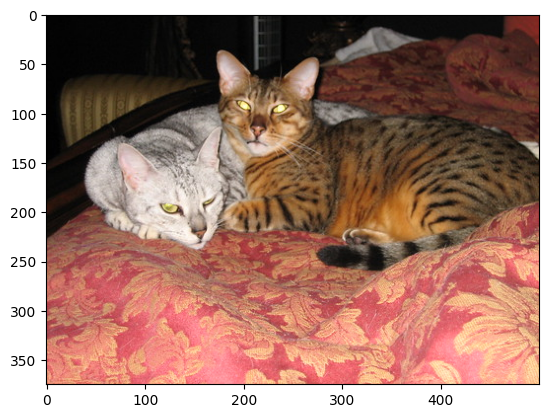

In [7]:
# show the orignal image
index = 5
input_image = Image.open(dataset.imgs[index][0]).convert('RGB')
plt.imshow(input_image)

In [8]:
output = resnet34(dataset[index][0].view(1, 3, 224, 224))
values, indices = torch.topk(output, 3)
print("Top 3-classes:", indices[0].numpy(), [classes[x] for x in indices[0].numpy()])
print("Raw class scores:", values[0].detach().numpy())

Top 3-classes: [285 281 282] ['Egyptian cat', 'tabby, tabby cat', 'tiger cat']
Raw class scores: [13.175314 11.065537 10.584748]


### Grad-CAM
* **Overview:** Given an image, and a category (â€˜tiger catâ€™) as input, we forward-propagate the image through the model to obtain the `raw class scores` before softmax. The gradients are set to zero for all classes except the desired class (tiger cat), which is set to 1. This signal is then backpropagated to the `rectified convolutional feature map` of interest, where we can compute the coarse Grad-CAM localization (blue heatmap).


* **To Do**: Define your own function Grad_CAM to achieve the visualization of the given images. For each image, choose the top-3 possible labels as the desired classes. Compare the heatmaps of the three classes, and conclude.


* **To be submitted within 2 weeks**: this notebook, **cleaned** (i.e. without results, for file size reasons: `menu > kernel > restart and clean`), in a state ready to be executed (if one just presses 'Enter' till the end, one should obtain all the results for all images) with a few comments at the end. No additional report, just the notebook!


* **Hints**:
 + We need to record the output and grad_output of the feature maps to achieve Grad-CAM. In pytorch, the function `Hook` is defined for this purpose. Read the tutorial of [hook](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks) carefully.
 + The pretrained model resnet34 doesn't have an activation function after its last layer, the output is indeed the `raw class scores`, you can use them directly.
 + The size of feature maps is 7x7, so your heatmap will have the same size. You need to project the heatmap to the resized image (224x224, not the original one, before the normalization) to have a better observation. The function [`torch.nn.functional.interpolate`](https://pytorch.org/docs/stable/nn.functional.html?highlight=interpolate#torch.nn.functional.interpolate) may help.  
 + Here is the link of the paper [Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/pdf/1610.02391.pdf)

Class: â€˜pug, pug-dogâ€™ | Class: â€˜tabby, tabby catâ€™
- | -
![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/dog.jpg)| ![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/cat.jpg)

In [9]:
def grad_cam(img,category):

  def forward_hook(module,input,output):
    activation.append(output.data)

  def backward_hook(module,grad_input,grad_output):
    grad.append(grad_output[0])

  grad = []
  activation = []


  # Add hook to get the tensors
  model.layer4[-1].bn2.register_forward_hook(forward_hook)
  model.layer4[-1].bn2.register_backward_hook(backward_hook)

  # Forward pass to get activations
  output = model(img)

  #Classes
  loss = np.zeros((1,output.size()[-1]),dtype = np.float32)
  loss[0][category] = 1
  loss = torch.from_numpy(loss).requires_grad_(True)
  loss = torch.sum(loss * output)

  # Clear gradients
  model.zero_grad()

  # Backward pass to get gradients
  loss.backward() # add retain_graph=T if error

  # get the gradients and activations collected in the hook

  grads = grad[0].cpu().data.numpy().squeeze()

  fmap = activation[0].cpu().data.numpy().squeeze()

  #Compute weights
  tmp = grads.reshape([grads.shape[0],-1])
  weights = np.mean(tmp,axis=1)

  # Compute heatmap
  cam = np.zeros(grads.shape[1:])
  for i,w in enumerate(weights):
    cam += w*fmap[i,:]

  cam = (cam > 0)*cam

  # Interpolate values
  cam = torch.from_numpy(cam.reshape(1,1,7,7))
  cam = F.interpolate(cam,scale_factor=32,mode='bilinear')
  cam = cam.numpy()[0,0,:,:]

  # Normalize the heatmap
  cam = cam / np.max(cam)

  return cam

In [10]:
import cv2
def join_heatmap(img, map):

  # Construct a map
  cam = cv2.applyColorMap(np.uint8(255*map), cv2.COLORMAP_JET)
  cam = np.float32(cam)/255

  # Add the image to its heatmap
  full_image = cv2.addWeighted(cam, 0.5, img, 0.5, 0.0)
  full_image = np.uint8(255*full_image[:, :, ::-1])

  return full_image

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1359: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


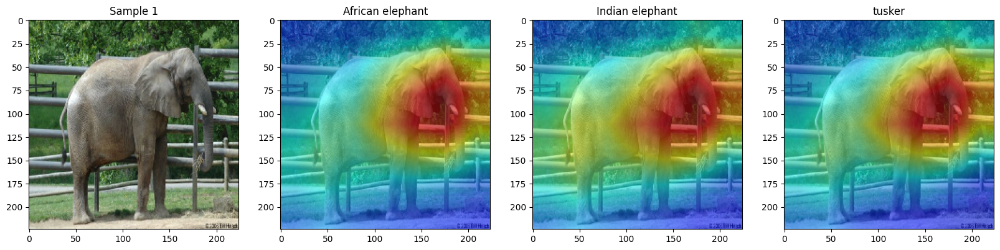

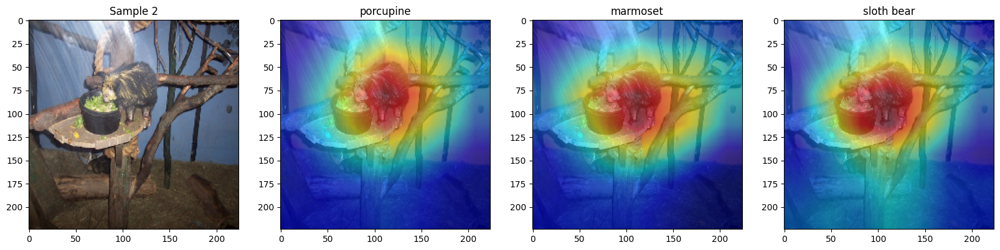

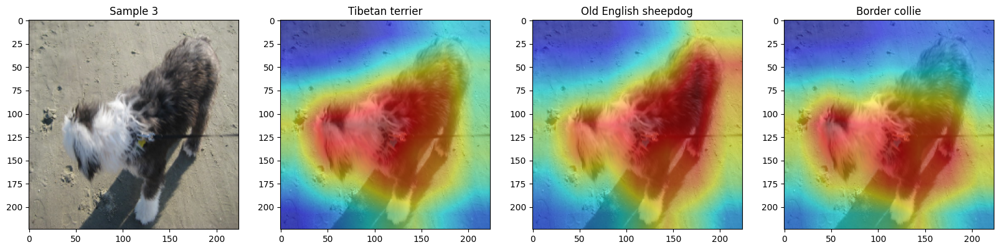

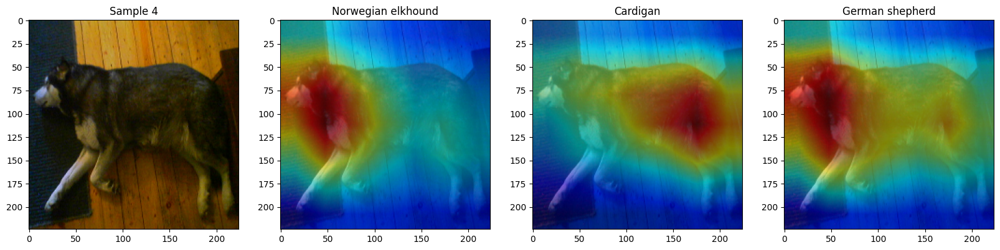

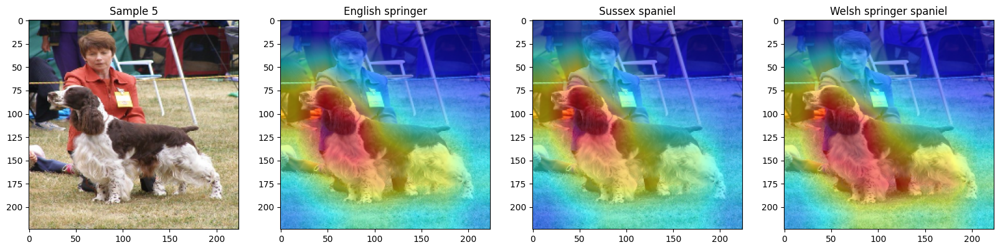

...

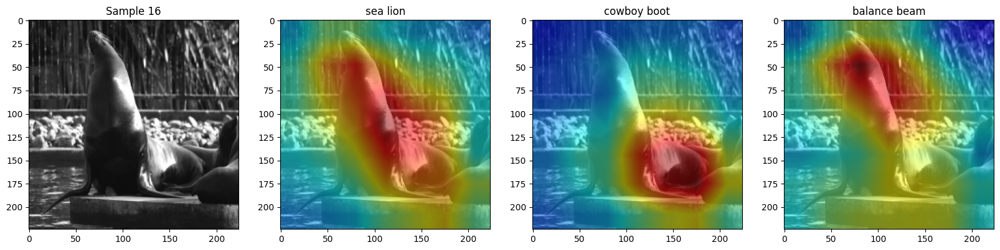

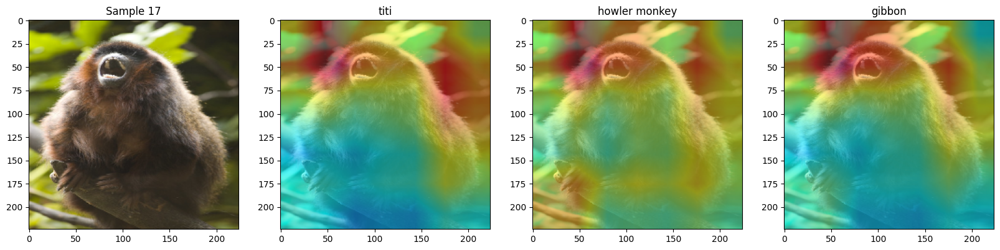

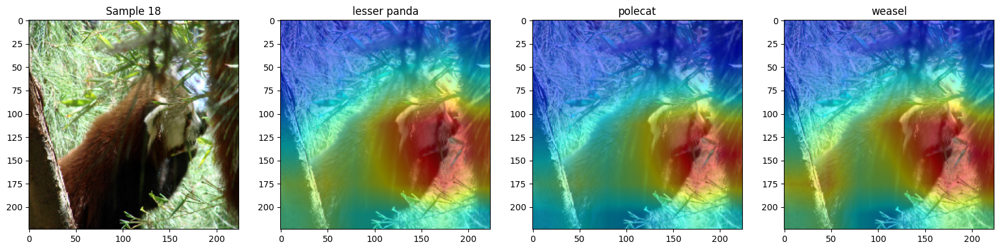

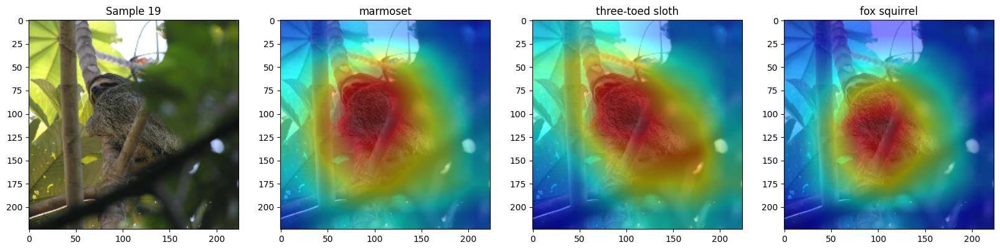

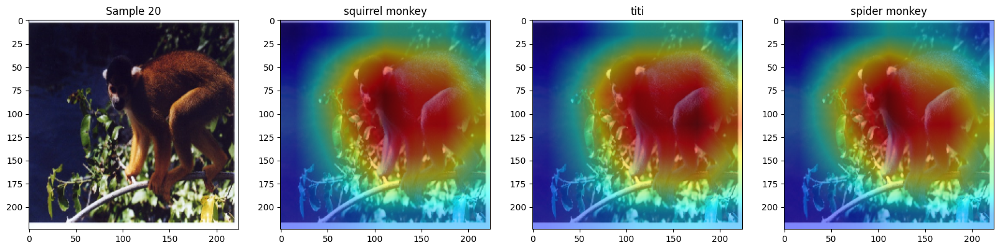

In [11]:
for i in range(20):

  image = np.array(Image.open(dataset.imgs[i][0]).convert('RGB'))
  image = np.float32(cv2.resize(image, (224, 224))) / 255
  input = dataset[i][0].view(1, 3, 224, 224)

  model = models.resnet34(pretrained=True)
  model.eval()

  output = model(input)
  values, idx = torch.topk(output,3)

  f, ax = plt.subplots(1,4,figsize=(20,5))
  ax[0].imshow(image)
  ax[0].set_title('Sample '+str(i+1))

  for j in range(3):
    category = idx[0].numpy()[j]
    heatmap = grad_cam(input, category)
    full_image = join_heatmap(image,heatmap)
    ax[j+1].imshow(full_image)
    names = classes[category].split(',')
    ax[j+1].set_title(names[0])

  plt.show()


In this TP, we have implemented our own Grad_Cam function, which maps a heatmap of a specific category on a given image. This helps understanding how the neural network works and how its predictions are formuled.

We were given 20 images in which apply our Grad_Cam implementation. For each, the top-3 possible labels are shown. We can see how, in most of the cases, the heatmap adjusts to the body of the object accurately in the 3 cases, with similar labels (all big mammals, all dog breeds, all foxes, etc.). However, we can mention 2 cases where even if the labels are adequate the heatmaps differ and 4 other cases of mismatches. The first two cases are:

- Sample 4, where the second heatmap focuses on the back of the dog rather than on the head, even if it is labeled as a dog breed ("Cardigan").

- Sample 10, where all the the three label are about animals with horns but the heatmap increases both form the first to the second one and from the second to the third one.

The failed predictions include the following:

- In Sample 11 we see an obvious error. Although the heatmap is correctly focused, the first prediction is a plant. The 2nd and 3rd predictions are also wrong, as they are not even in the same family as the original animal.

- In Sample 13 the heatmap is not focused correctly. Especially in the third case we see that the heatmap is focused on the corner. The first guess is completely wrong. The best result was obtained on the 2nd heatmap.

- In Sample 14, the heatmap manages to focus on the animal. The first two predictions are good but the 3rd prediction ("wallaby") is completely wrong.

- In Sample 16, the 2nd and 3rd predictions are completely wrong, not even an animal. We also see that the 2nd and 3rd heatmaps are distracted.
